In [10]:
import soundfile as sf
import numpy as np

import noisereduce as nr
import matplotlib.pyplot as plt
import IPython.display as ipd
import librosa

In [5]:
noise_clip, nsr = sf.read('..\\data\\may-collection-raw\\achterafDbTest.wav')
print(nsr)
noise_clip = noise_clip[:int(7.8*nsr)]
ipd.Audio(data=noise_clip, rate=nsr)

44100


In [7]:
aud, sr = sf.read('..\\data\\may-collection-raw\\121648-recording5.wav')
aud = aud[60*sr:100*sr]

aud_red = nr.reduce_noise(y=aud, sr=sr, y_noise=noise_clip)
aud_red_stationary = nr.reduce_noise(y=aud, sr=sr, y_noise=noise_clip, stationary=True)

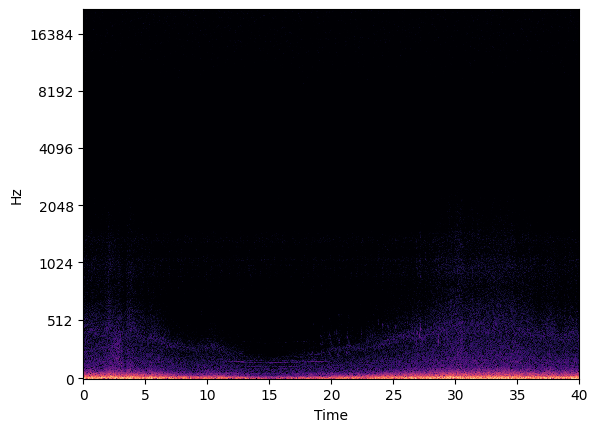

In [15]:
D = librosa.stft(aud)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
librosa.display.specshow(S_db, sr=sr, x_axis="time", y_axis="mel")
ipd.Audio(data=aud, rate=sr)

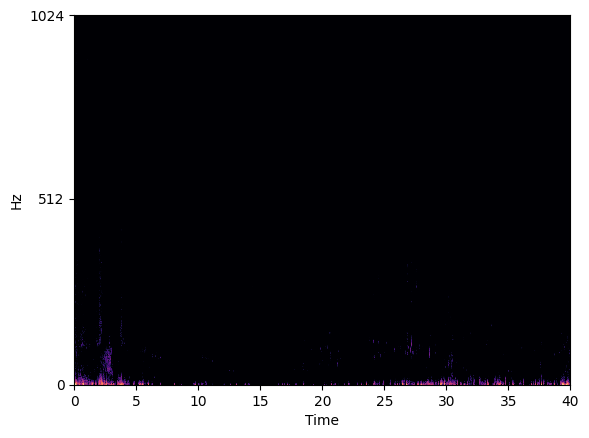

In [17]:
D = librosa.stft(aud_red)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
librosa.display.specshow(S_db, sr=sr, x_axis="time", y_axis="mel", fmax=1024)

ipd.Audio(data=aud_red, rate=sr)

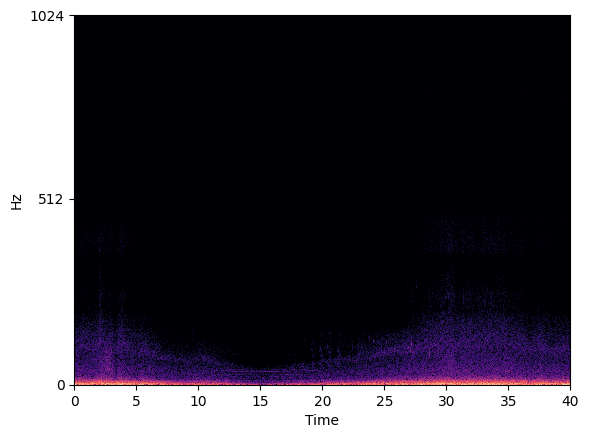

In [16]:
D = librosa.stft(aud_red_stationary)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
librosa.display.specshow(S_db, sr=sr, x_axis="time", y_axis="mel", fmax=1024)

ipd.Audio(data=aud_red_stationary, rate=sr)